In [1]:
import geopandas as gpd
import math
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

In [2]:
CRS = 'EPSG:2263'

In [3]:
cbg_gdf = gpd.read_file('./data/nyc_cbgs.geojson')
cbg_gdf = cbg_gdf.to_crs(CRS)
cbg_gdf = cbg_gdf.rename(columns={
    'CensusBlockGroup': 'cbg',
})
cbg_gdf['cbg'] = cbg_gdf['cbg'].astype(int)
cbg_gdf = cbg_gdf[['cbg', 'geometry']]

cbg_df = pd.read_csv('./data/cbg_attr_and_cluster_1021.csv')
cbg_df = cbg_df.rename(columns={
    'census_block_group': 'cbg',
    'Cluster': 'cluster',
    'Total Population': 'population',
})
cbg_df = cbg_df[['cbg', 'cluster', 'population']]
cbg_df['cluster'] = cbg_df['cluster'].astype('category')

cbg_gdf = cbg_gdf.merge(cbg_df, how='inner', on=['cbg'])

In [4]:
poi_df = pd.read_csv('./exports/poi_health_recategorized.csv')
poi_df.head()

,placekey,cbg,naics_code,category,sub_category,location_name,area_square_feet,latitude,longitude
0,226-222@627-s4n-pqf,360610158022,311811,Snacks and Bakeries,Retail Bakeries,Unna Bakery,NaN,40.787027,-73.950435
1,225-225@627-s99-9xq,360810849002,311811,Snacks and Bakeries,Retail Bakeries,Fay Da Bakery,24759.0,40.756244,-73.829009
2,225-225@627-vsw-7nq,360850146071,311811,Snacks and Bakeries,Retail Bakeries,Amici Bakery,16166.0,40.559894,-74.166016
3,22b-222@627-s7s-jqf,360810475001,311811,Snacks and Bakeries,Retail Bakeries,Sunrise Bakery & Cafe,732.0,40.736802,-73.879306
4,23h-222@627-s9z-n3q,360810779071,311811,Snacks and Bakeries,Retail Bakeries,Avraham Bakery,12069.0,40.724409,-73.820241


In [5]:
poi_df.columns

Index(['placekey', 'cbg', 'naics_code', 'category', 'sub_category',
       'location_name', 'area_square_feet', 'latitude', 'longitude'],
      dtype='object')

In [6]:
poi_df = poi_df.groupby(by=['placekey']).agg({
    'cbg': 'last',
    'naics_code': 'last',
    'category': 'last',
    'sub_category': 'last',
    'location_name': 'last',
    'area_square_feet': 'last',
    'latitude': 'last',
    'longitude': 'last',
}).reset_index()
poi_df = poi_df.sort_values(by=['naics_code'])
#poi_df.to_csv('./exports/poi.csv', index=False)
poi_df.head()

,placekey,cbg,naics_code,category,sub_category,location_name,area_square_feet,latitude,longitude
5480,226-222@627-s4n-pqf,360610158022,311811,Snacks and Bakeries,Retail Bakeries,Unna Bakery,NaN,40.787027,-73.950435
5345,225-225@627-s99-9xq,360810849002,311811,Snacks and Bakeries,Retail Bakeries,Fay Da Bakery,24759.0,40.756244,-73.829009
5349,225-225@627-vsw-7nq,360850146071,311811,Snacks and Bakeries,Retail Bakeries,Amici Bakery,16166.0,40.559894,-74.166016
9721,22b-222@627-s7s-jqf,360810475001,311811,Snacks and Bakeries,Retail Bakeries,Sunrise Bakery & Cafe,732.0,40.736802,-73.879306
27393,23h-222@627-s9z-n3q,360810779071,311811,Snacks and Bakeries,Retail Bakeries,Avraham Bakery,12069.0,40.724409,-73.820241


In [7]:
poi_gdf = gpd.GeoDataFrame(poi_df,
                           geometry=gpd.points_from_xy(poi_df['longitude'],
                                                       poi_df['latitude']),
                           crs='EPSG:4326')
poi_gdf = poi_gdf.to_crs(CRS)

In [8]:
def plot_locations(gdf, attr, SIZE=10):
    attrs = list(set(gdf[attr]))
    attrs.sort()
    n_attr = len(attrs)
    fig, ax = plt.subplots(n_attr, 1, figsize=(SIZE, SIZE * n_attr))
    for i, attr_value in enumerate(attrs):
        cbg_gdf.plot(ax=ax[i], color='#eee')
        poi_gdf[poi_gdf[attr] == attr_value].plot(ax=ax[i],
                                                  color=f'C{i % 6}',
                                                  markersize=1,
                                                  alpha=0.5)
        ax[i].set_title(attr_value)
    plt.tight_layout()
    plt.show()

In [9]:
categories = list(set(poi_gdf['category']))
categories.sort()
display(categories)

['Beer, Wine, and Liquor Stores',
 'Big Box Grocers',
 'Delis & Convenience Stores',
 'Drinking Places',
 'Fast-Food Restaurants',
 'Food Services',
 'Full-Service Restaurants',
 'General Merchandise Stores',
 'Limited-Service Restaurants',
 'Pharmacies and Drug Stores',
 'Snacks and Bakeries',
 'Specialty Food Stores',
 'Supermarkets',
 'Tobacco Stores']

In [10]:
join_gdf = cbg_gdf.merge(poi_gdf.drop(columns=['geometry']),
                         on='cbg',
                         how='left')

In [11]:
poi_pivot_gdf = poi_df[['cbg', 'placekey', 'category']]
poi_pivot_gdf = poi_pivot_gdf.groupby(
    by=['cbg', 'category']).count().reset_index()
poi_pivot_gdf = poi_pivot_gdf.pivot(index='cbg',
                                    columns=['category'],
                                    values='placekey').reset_index()
poi_pivot_gdf = poi_pivot_gdf.fillna(0)
poi_pivot_gdf = poi_pivot_gdf.iloc[:, :].astype(int)
poi_pivot_gdf.head()

category,cbg,"Beer, Wine, and Liquor Stores",Big Box Grocers,Delis & Convenience Stores,Drinking Places,Fast-Food Restaurants,Food Services,Full-Service Restaurants,General Merchandise Stores,Limited-Service Restaurants,Pharmacies and Drug Stores,Snacks and Bakeries,Specialty Food Stores,Supermarkets,Tobacco Stores
0,360050002001,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,360050002002,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,360050004001,0,0,1,0,0,0,1,0,0,0,0,0,0,0
3,360050004002,1,0,1,1,0,0,2,0,0,0,0,0,0,0
4,360050004003,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [12]:
join_gdf = cbg_gdf.merge(poi_pivot_gdf, on='cbg', how='left')
join_gdf = join_gdf.fillna(0)

poi_area_gdf = join_gdf
# Divide counts by CBG Area
for i in range(4, 10):
    poi_area_gdf.iloc[:, i] = poi_area_gdf.iloc[:, i] / (
        poi_area_gdf['geometry'].geometry.area * 1000)

poi_population_gdf = join_gdf
# Divide counts by Population
for i in range(4, 10):
    poi_population_gdf.iloc[:, i] = poi_population_gdf.iloc[:, i] / (
        poi_population_gdf['population'])
poi_population_gdf.head()

,cbg,geometry,cluster,population,"Beer, Wine, and Liquor Stores",Big Box Grocers,Delis & Convenience Stores,Drinking Places,Fast-Food Restaurants,Food Services,Full-Service Restaurants,General Merchandise Stores,Limited-Service Restaurants,Pharmacies and Drug Stores,Snacks and Bakeries,Specialty Food Stores,Supermarkets,Tobacco Stores
0,360050175002,"MULTIPOLYGON (((1007579.278 241875.151, 100781...",2,656,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,360050141001,"MULTIPOLYGON (((1007327.986 239855.027, 100751...",2,1228,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,360050145001,"MULTIPOLYGON (((1010307.431 242068.478, 101052...",2,2716,0.0,0.0,0.000000e+00,0.0,0.000000e+00,0.0,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,360050075002,"MULTIPOLYGON (((1009064.051 238018.664, 100909...",2,3488,0.0,0.0,2.442312e-13,0.0,0.000000e+00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,360050418001,"MULTIPOLYGON (((1022160.816 265436.445, 102254...",0,657,0.0,0.0,1.004371e-12,0.0,3.013114e-12,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [13]:
def plot_choropleths(gdf, attrs, title_suffix, SIZE=10):
    n_attrs = len(attrs)
    fig, ax = plt.subplots(n_attrs, 1, figsize=(SIZE, SIZE * n_attrs))
    cmaps = ['Blues', 'Oranges', 'Greens', 'Reds', 'Purples', 'Greys']
    for i, attr in enumerate(attrs):
        try:
            gdf.plot(ax=ax[i],
                     column=attr,
                     cmap=cmaps[i % 6],
                     scheme='FisherJenksSampled',
                     legend=True,
                     edgecolor='#999',
                     linewidth=0.1)
            ax[i].set_title(f'{attr} {title_suffix}')
        except:
            print(f'Error with {attr}')
    plt.tight_layout()
    plt.show()

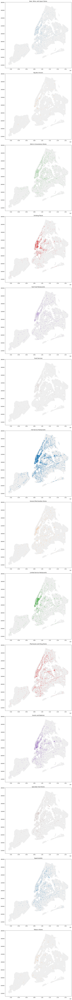

Error with Tobacco Stores


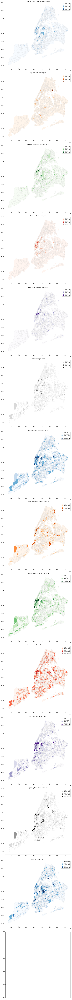

Error with Tobacco Stores


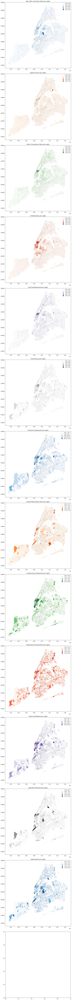

In [14]:
plot_locations(poi_gdf, 'category')
plot_choropleths(poi_area_gdf, categories, 'per sq km')
plot_choropleths(poi_population_gdf, categories, 'per capita')